In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.tree import DecisionTreeRegressor
import tensorflow as tf
from tensorflow import keras
import catboost as cb

# Configure

In [54]:
tf.config.set_visible_devices([], 'GPU')

# Import dataset

id - Unique ID for each home sold \
date - Date of the home sale \
price - Price of each home sold \
bedrooms - Number of bedrooms \
bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower \
sqft_living - Square footage of the apartments interior living space \
sqft_lot - Square footage of the land space \
floors - Number of floors \
waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not \
view - An index from 0 to 4 of how good the view of the property was \
condition - An index from 1 to 5 on the condition of the apartment, \
grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design. \
sqft_above - The square footage of the interior housing space that is above ground level \
sqft_basement - The square footage of the interior housing space that is below ground level \
yr_built - The year the house was initially built \
yr_renovated - The year of the house’s last renovation \
zipcode - What zipcode area the house is in \
lat - Lattitude \
long - Longitude \
sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors \
sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors \


In [55]:
dataset_df = pd.read_csv('kc_house_data.csv')
dataset_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


# Data visualization

In [56]:
dataset_df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


array([[<AxesSubplot: title={'center': 'id'}>,
        <AxesSubplot: title={'center': 'price'}>,
        <AxesSubplot: title={'center': 'bedrooms'}>,
        <AxesSubplot: title={'center': 'bathrooms'}>],
       [<AxesSubplot: title={'center': 'sqft_living'}>,
        <AxesSubplot: title={'center': 'sqft_lot'}>,
        <AxesSubplot: title={'center': 'floors'}>,
        <AxesSubplot: title={'center': 'waterfront'}>],
       [<AxesSubplot: title={'center': 'view'}>,
        <AxesSubplot: title={'center': 'condition'}>,
        <AxesSubplot: title={'center': 'grade'}>,
        <AxesSubplot: title={'center': 'sqft_above'}>],
       [<AxesSubplot: title={'center': 'sqft_basement'}>,
        <AxesSubplot: title={'center': 'yr_built'}>,
        <AxesSubplot: title={'center': 'yr_renovated'}>,
        <AxesSubplot: title={'center': 'zipcode'}>],
       [<AxesSubplot: title={'center': 'lat'}>,
        <AxesSubplot: title={'center': 'long'}>,
        <AxesSubplot: title={'center': 'sqft_living1

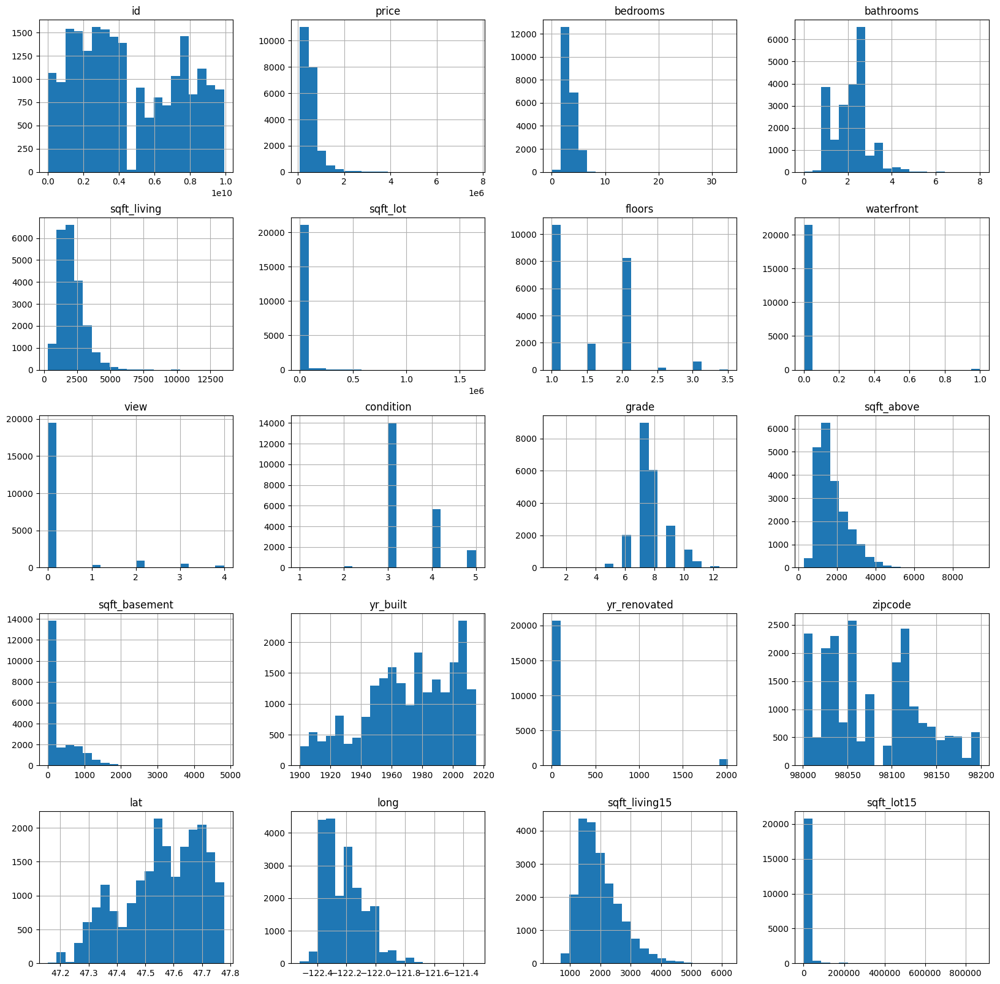

In [57]:
dataset_df.hist(bins=20, figsize=(20, 20))

/var/folders/g0/db_6133s4c72c83lmc3808m40000gn/T/ipykernel_9145/3125298116.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dataset_df.corr(), annot=True, mask=np.triu(dataset_df.corr()), ax=axis)


<AxesSubplot: >

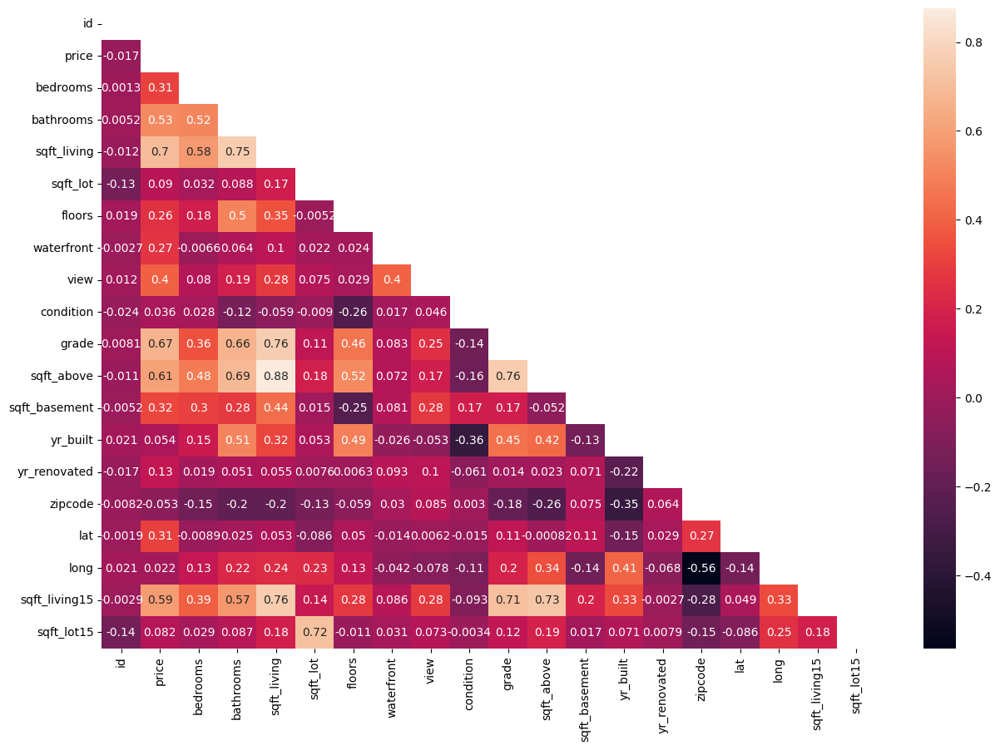

In [58]:
figure, axis = plt.subplots(figsize=(15, 10))
sns.heatmap(dataset_df.corr(), annot=True, mask=np.triu(dataset_df.corr()), ax=axis)

In [59]:
selected_features = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement', 'yr_built']
sample_df = dataset_df[selected_features]

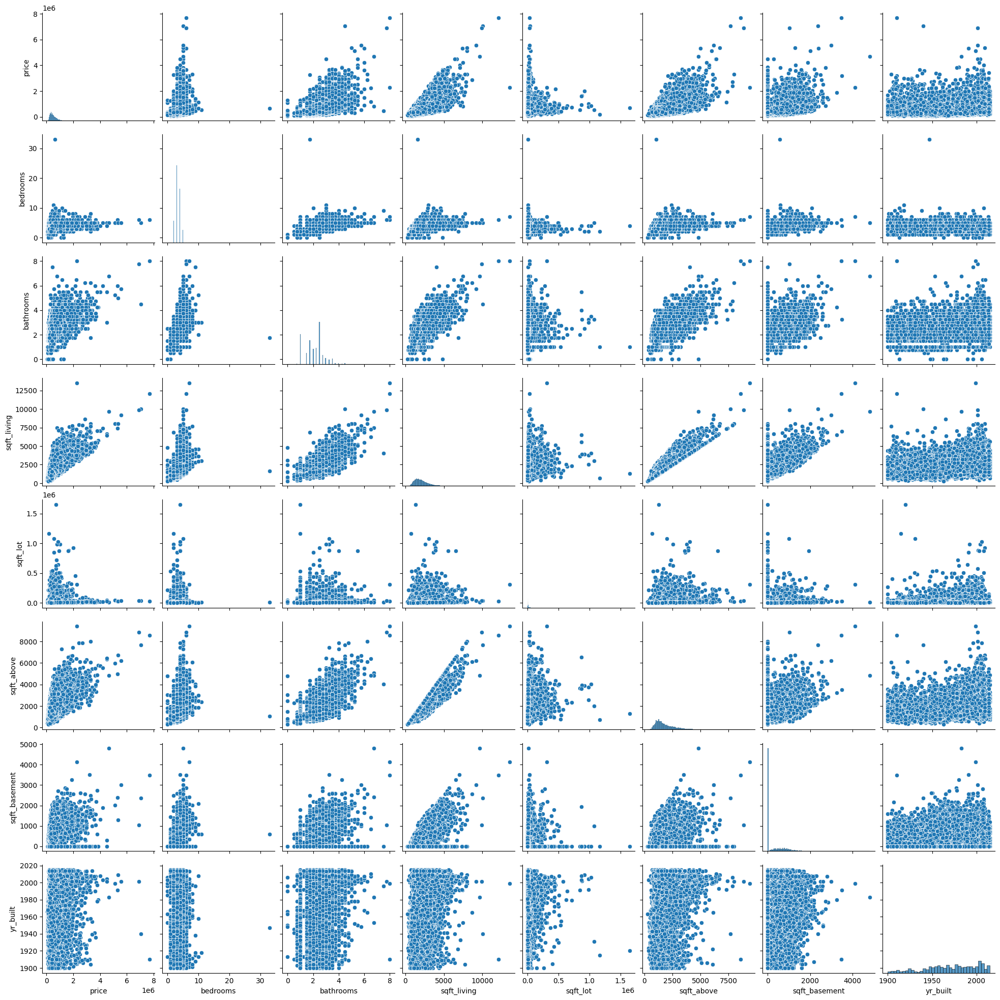

In [60]:
sns.pairplot(sample_df)

# Feature engineering

<AxesSubplot: xlabel='price', ylabel='Count'>

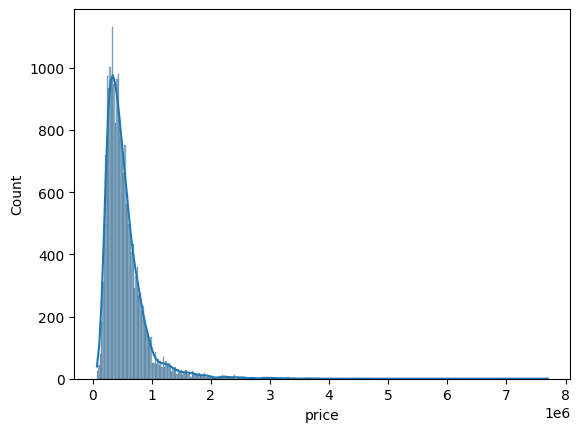

In [61]:
sns.histplot(dataset_df['price'], kde=True)

In [62]:
len(dataset_df) * 0.01

216.13

In [63]:
dataset_df = dataset_df.sort_values('price', ascending=False).iloc[216:]

<AxesSubplot: xlabel='price', ylabel='Count'>

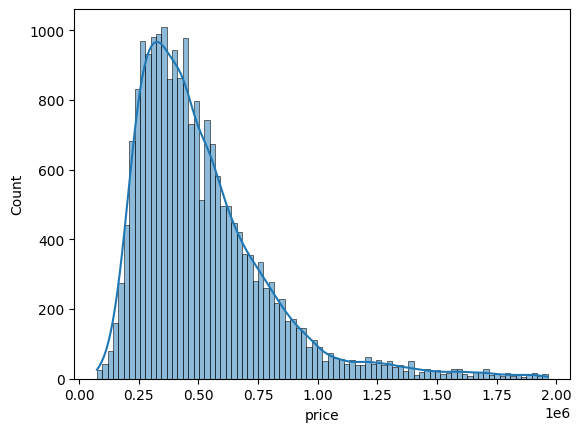

In [64]:
sns.histplot(dataset_df['price'], kde=True)

In [65]:
dataset_df.drop(columns=['id', 'date'], inplace=True)

In [66]:
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(
  scaler.fit_transform(dataset_df),
  columns=dataset_df.columns,
)

<AxesSubplot: >

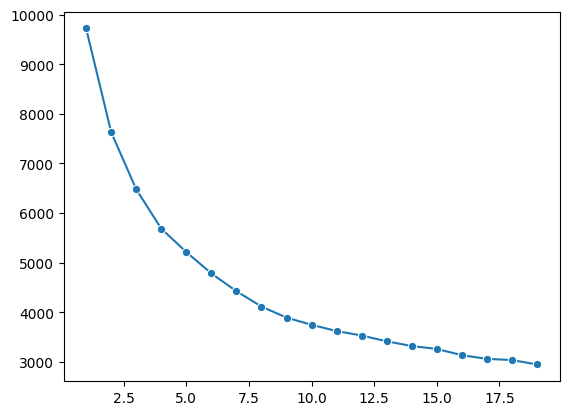

In [67]:
WCSSs = {}

for k in range(1, 20):
  k_means = KMeans(n_clusters=k, n_init=10)
  k_means.fit(scaled_df)
  WCSSs[k] = k_means.inertia_

sns.lineplot(WCSSs, marker='o')

In [68]:
k_means = KMeans(n_clusters=9, n_init=10)
k_means.fit(scaled_df)

KMeans(n_clusters=9, n_init=10)

In [69]:
dataset_df['cluster'] = k_means.labels_

scaled_df = pd.DataFrame(
  scaler.fit_transform(dataset_df),
  columns=dataset_df.columns,
)

scaled_df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,cluster
0,1.000000,0.151515,0.500000,0.490591,0.008007,0.2,0.0,0.75,0.75,0.666667,0.511921,0.000000,0.443478,0.0,0.015152,0.746984,0.254983,0.365609,0.014553,0.375
1,0.997354,0.121212,0.533333,0.556452,0.018677,0.4,0.0,0.00,0.50,0.916667,0.580645,0.000000,0.852174,0.0,0.020202,0.782210,0.300664,0.649416,0.039729,0.125
2,0.996825,0.151515,0.600000,0.794355,0.013843,0.8,0.0,0.25,0.75,0.833333,0.667602,0.352761,0.765217,0.0,0.196970,0.655139,0.252492,0.612317,0.015892,0.125
3,0.994709,0.121212,0.366667,0.380376,0.004469,0.0,1.0,1.00,0.75,0.583333,0.178121,0.478528,0.547826,0.0,0.166667,0.901721,0.215947,0.413838,0.015182,0.375
4,0.994709,0.090909,0.233333,0.408602,0.007297,0.0,1.0,1.00,0.75,0.583333,0.231417,0.426380,0.521739,0.0,0.196970,0.599646,0.248339,0.617882,0.018275,0.375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21392,0.003704,0.090909,0.133333,0.076613,0.006001,0.0,0.0,0.00,0.50,0.416667,0.079944,0.000000,0.469565,0.0,0.732323,0.551391,0.147841,0.137451,0.012175,0.000
21393,0.003175,0.060606,0.133333,0.059140,0.005727,0.0,0.0,0.00,0.00,0.333333,0.061711,0.000000,0.373913,0.0,0.843434,0.522599,0.169435,0.085513,0.009590,0.000
21394,0.002646,0.030303,0.100000,0.018817,0.002744,0.0,0.0,0.00,0.25,0.250000,0.019635,0.000000,0.104348,0.0,0.065657,0.794595,0.506645,0.148581,0.007867,0.750
21395,0.001587,0.060606,0.133333,0.065860,0.009585,0.0,0.0,0.00,0.00,0.333333,0.068724,0.000000,0.365217,0.0,0.843434,0.511501,0.198505,0.241328,0.011184,0.000


# Split data

In [70]:
x = scaled_df.drop(columns=['price']).values
y = scaled_df['price'].values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

# Model training

## Sequential model

In [71]:
train_dataset = cb.Pool(x_train, y_train)
test_dataset = cb.Pool(x_test, y_test)

In [72]:
model = cb.CatBoostRegressor(loss_function='RMSE')

In [73]:
grid = {
  'iterations': [2000, 2500],
  'learning_rate': [0.01, 0.05, 0.1],
  'depth': [4, 6, 8],
  'l2_leaf_reg': [0.2, 0.5, 1, 3],
}

grid_search_result = model.grid_search(grid, train_dataset, plot=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.2754924	test: 0.2753709	best: 0.2753709 (0)	total: 10.1ms	remaining: 20.2s
1:	learn: 0.2731221	test: 0.2729957	best: 0.2729957 (1)	total: 17.3ms	remaining: 17.3s
2:	learn: 0.2707567	test: 0.2706282	best: 0.2706282 (2)	total: 24.4ms	remaining: 16.2s
3:	learn: 0.2683842	test: 0.2682421	best: 0.2682421 (3)	total: 27.3ms	remaining: 13.6s
4:	learn: 0.2660774	test: 0.2659273	best: 0.2659273 (4)	total: 29.8ms	remaining: 11.9s
5:	learn: 0.2637502	test: 0.2635832	best: 0.2635832 (5)	total: 35.6ms	remaining: 11.8s
6:	learn: 0.2614577	test: 0.2612745	best: 0.2612745 (6)	total: 43.7ms	remaining: 12.4s
7:	learn: 0.2591925	test: 0.2590069	best: 0.2590069 (7)	total: 49.8ms	remaining: 12.4s
8:	learn: 0.2569765	test: 0.2567783	best: 0.2567783 (8)	total: 55.1ms	remaining: 12.2s
9:	learn: 0.2548102	test: 0.2546200	best: 0.2546200 (9)	total: 65.6ms	remaining: 13.1s
10:	learn: 0.2526156	test: 0.2524340	best: 0.2524340 (10)	total: 67.6ms	remaining: 12.2s
11:	learn: 0.2504401	test: 0.2502418	best

{'params': {'depth': 6,
  'iterations': 2500,
  'learning_rate': 0.05,
  'l2_leaf_reg': 0.2},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
              

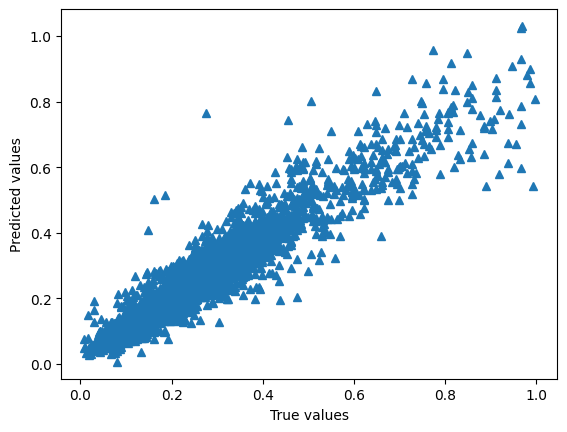

In [74]:
y_predicted = model.predict(x_test)

plt.plot(y_test, y_predicted, '^')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.show()

In [75]:
mse = mean_squared_error(y_test, y_predicted)
mae = mean_absolute_error(y_test, y_predicted)
r2 = r2_score(y_test, y_predicted)

print('MSE: ', mse)
print('MAE: ', mae)
print('R2: ', r2)

MSE:  0.0022804724483014645
MAE:  0.03049584856427558
R2:  0.9037797150574494


## Decision Tree

In [76]:
model = DecisionTreeRegressor()

In [77]:
model.fit(x_train, y_train)


DecisionTreeRegressor()

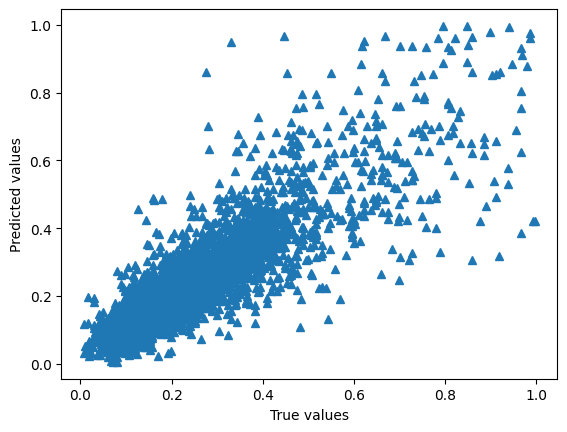

In [78]:
y_predicted = model.predict(x_test)

plt.plot(y_test, y_predicted, '^')
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.show()

In [79]:
mse = mean_squared_error(y_test, y_predicted)
mae = mean_absolute_error(y_test, y_predicted)
r2 = r2_score(y_test, y_predicted)

print('MSE: ', mse)
print('MAE: ', mae)
print('R2: ', r2)

MSE:  0.006070874158685437
MAE:  0.048608503622113435
R2:  0.743850778888314
